# Data Viz Project: Gentrification in NYC

In [1]:
import geopandas as gpd
from census import Census
from us import states
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

%matplotlib inline

pal = ["#E69F00", "#56B4E9", "#009E73", "#F0E442", "#0072B2", "#D55E00", "#CC79A7", "#999999", "#000000"]


In [2]:
nyct_shape = gpd.read_file(r".\data\nyct2010_18a\nyct2010.shp")
nyct_shape[(nyct_shape.CT2010 == '009800')]
#some tracts are duplicated with different geometries

,CTLabel,BoroCode,BoroName,CT2010,BoroCT2010,CDEligibil,NTACode,NTAName,PUMA,Shape_Leng,Shape_Area,geometry
1,98,1,Manhattan,009800,1009800,I,MN19,Turtle Bay-East Midtown,3808,5534.199811,1.906016e+06,"POLYGON ((994133.507019043 214848.8975830078, ..."
31,98,3,Brooklyn,009800,3009800,E,BK34,Sunset Park East,4012,5203.979585,1.625499e+06,"POLYGON ((982932.7817993164 173745.2182006836,..."
750,98,2,Bronx,009800,2009800,E,BX59,Westchester-Unionport,3709,10244.286523,5.559622e+06,"POLYGON ((1027448.348022461 241126.4978027344,..."
1088,98,4,Queens,009800,4009800,E,QN55,South Ozone Park,4113,6831.555297,1.460890e+06,"POLYGON ((1032524.344238281 189229.5535888672,..."


In [3]:
nyct_shape.crs

{'proj': 'lcc',
 'lat_1': 40.66666666666666,
 'lat_2': 41.03333333333333,
 'lat_0': 40.16666666666666,
 'lon_0': -74,
 'x_0': 300000,
 'y_0': 0,
 'datum': 'NAD83',
 'units': 'us-ft',
 'no_defs': True}

In [4]:
nyct_shape.shape

(2166, 12)

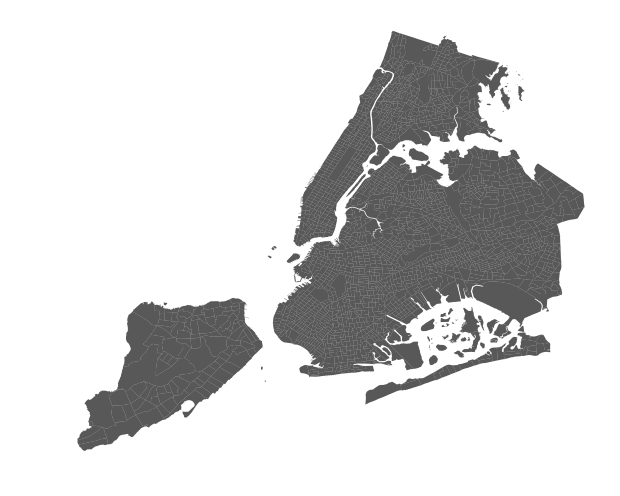

In [5]:
# Complete shapefile of NYC
f, ax = plt.subplots(1, figsize=(10, 8.5))
ax = nyct_shape.plot(ax=ax, column=None, alpha=0.65, categorical=False, legend=False, color='#000000', edgecolor='')
ax.set_axis_off()
ax.set_facecolor('#dd7e6b')

plt.show()

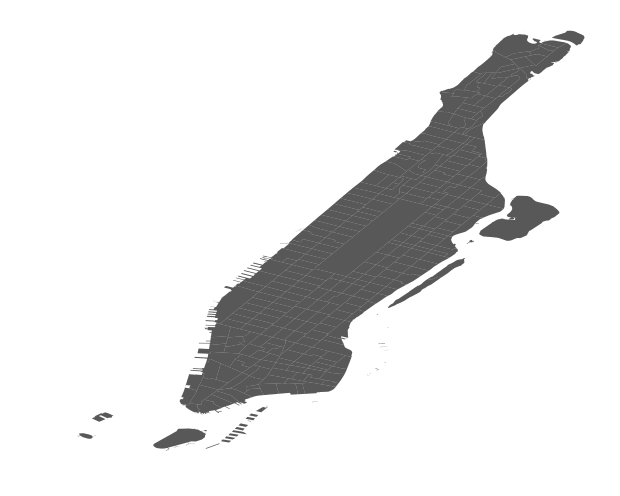

In [6]:
# plot of Brooklin
f, ax = plt.subplots(1, figsize=(10, 8.5))
ax = nyct_shape[nyct_shape.BoroCode=='1'].plot(ax=ax, column=None, alpha=0.65, categorical=False, legend=False, color='#000000', edgecolor='')
ax.set_axis_off()
ax.set_facecolor('#dd7e6b')

plt.show()

In [7]:
nyc_tracts = nyct_shape.CT2010.unique()
nyc_tracts.shape

(1335,)

In [8]:

c = Census("dcd349ab1deae5f90fef687a9f369d84bcd997fe")

nycy_tracts = list()
county = ['061', '081', '005', '085', '047']
for ct in county:
    nycy_tracts.append(c.sf1.get('NAME', geo={'for': 'tract:*',
                      'in': 'state:{} county:{}'.format(states.NY.fips, ct)}, year = 2000))
    
nycy_tracts = [val for sublist in nycy_tracts for val in sublist]
#difference between 2000 census tracts and 2010 census tracts
tracts_diff0010 = set([d['tract'] for d in nycy_tracts]).difference(set(nyc_tracts))
len(tracts_diff0010)
tracts_diff01000 = set(nyc_tracts).difference(set([d['tract'] for d in nycy_tracts]))
print(f'Number of tracts that are in shape file and not in 2000 census: {len(tracts_diff01000)}')
print(f'Number of tracts that are in 2000 census and not in shape file: {len(tracts_diff0010)}')

Number of tracts that are in shape file and not in 2000 census: 155
Number of tracts that are in 2000 census and not in shape file: 107


In [9]:
len(list(d['tract'] for d in nycy_tracts))

2217

## Extraction of data with Census API

### US Census and American Community Survey (5 years estimate)

We will use mainly data from the American Community Survey 2011-2015 (ACS5, that we will use as a shorhand for the 2013) and the decennial census (Vintage 2000-2010, Summary File 1 and Summary File 3). Note: sf3 is not available for the 2010 census, that is why we have used also data from the ACS) .

We are looking for data on population ethnicity

data from https://api.census.gov/data.html

We import from the `dict_data.py`, the dictionary with all the variables we need.

county code from [here](https://www2.census.gov/geo/docs/reference/codes/files/st36_ny_cou.txt)

In [10]:
from dict_data import *

## Ethnicity 

We use the data about the race of each householder. We considere five racial/ethnic groups

- white householder
- black householder
- Asians householder
- Latinos householder
- Others

In [11]:
data_list00 = []
data_list10 = []

#loop on the five boroughs 
county = ['061', '081', '005', '085', '047']

#loop on the five boroughs 
for ct in county:
    data_list00.append(pd.DataFrame.from_dict(c.sf1.state_county_tract(tuple(sf1_hhr_race_2000.keys()), '36', ct, Census.ALL, year = 2000)))
    data_list10.append(pd.DataFrame.from_dict(c.sf1.state_county_tract(tuple(sf1_hhr_race_2010.keys()), '36', ct, Census.ALL, year = 2010)))
df_hhr_race_2000 = pd.concat(data_list00)
df_hhr_race_2010 = pd.concat(data_list10)


df_hhr_race_2000.rename(sf1_hhr_race_2000, inplace=True, axis='columns')
df_hhr_race_2010.rename(sf1_hhr_race_2010, inplace=True, axis='columns')


In [12]:
#change data type to numeric
df_hhr_race_2010[list(sf1_hhr_race_2010.values())] = df_hhr_race_2010[list(sf1_hhr_race_2010.values())].apply(pd.to_numeric)
df_hhr_race_2000[list(sf1_hhr_race_2000.values())] = df_hhr_race_2000[list(sf1_hhr_race_2000.values())].apply(pd.to_numeric)


In [13]:
# create the counts for each group
df_hhr_race_2010['other_c10'] = df_hhr_race_2010.notHISP_tot_c10 - df_hhr_race_2010.notHISP_white_c10 - \
                                df_hhr_race_2010.notHISP_black_c10 - df_hhr_race_2010.notHISP_asian_c10
df_hhr_race_2010.drop(columns=['notHISP_tot_c10'], inplace=True)
df_hhr_race_2000['other_c00'] = df_hhr_race_2000.notHISP_tot_c00 - df_hhr_race_2000.notHISP_white_c00 - \
                                df_hhr_race_2000.notHISP_black_c00 - df_hhr_race_2000.notHISP_asian_c00
df_hhr_race_2000.drop(columns=['notHISP_tot_c00'], inplace=True)


In [14]:
# compute shares
cols = ['tot_c10',
 'notHISP_white_c10',
 'notHISP_black_c10',
 'notHISP_asian_c10',
       'other_c10']
for col in cols:
    df_hhr_race_2010[f'{col}_pct'] = df_hhr_race_2010[col] / df_hhr_race_2010['tot_c10']
    df_hhr_race_2010.loc[(df_hhr_race_2010.tot_c10 < 400),[f'{col}_pct']] = np.nan
cols = ['tot_c00',
 'notHISP_white_c00',
 'notHISP_black_c00',
 'notHISP_asian_c00',
       'other_c00']
for col in cols:
    df_hhr_race_2000[f'{col}_pct'] = df_hhr_race_2000[col] / df_hhr_race_2000['tot_c00']
    #consider only tracts with at least 300 householder
    df_hhr_race_2000.loc[(df_hhr_race_2000.tot_c00 < 300),[f'{col}_pct']] = np.nan

#df_hhr_race_2000.isnull().sum()
#df_hhr_race_2010.isnull().sum()

In [15]:
df_hhr_race_2000.columns

from scipy.stats import entropy

df_hhr_race_2000['racial_entropy'] = entropy(df_hhr_race_2000[['notHISP_white_c00_pct',
'notHISP_black_c00_pct', 'notHISP_asian_c00_pct', 'other_c00_pct']].values.transpose())
df_hhr_race_2000.replace(-np.inf, np.nan, inplace=True)
df_hhr_race_2000.drop(['tot_c00', 'notHISP_white_c00', 'notHISP_black_c00',
       'notHISP_asian_c00', 'HISP_tot_c00',
       'other_c00'], axis=1, inplace=True)
df_hhr_race_2010['racial_entropy'] = entropy(df_hhr_race_2010[['notHISP_white_c10_pct',
'notHISP_black_c10_pct', 'notHISP_asian_c10_pct', 'other_c10_pct']].values.transpose())
df_hhr_race_2010.replace(-np.inf, np.nan, inplace=True)
df_hhr_race_2010.drop(['tot_c10', 'notHISP_white_c10', 'notHISP_black_c10',
       'notHISP_asian_c10', 'HISP_tot_c10',
       'other_c10'], axis = 1, inplace=True)


In [38]:
df_hhr_race_2000['racial_entropy'].describe()

count    2050.000000
mean        0.625339
std         0.329449
min         0.016359
25%         0.346942
50%         0.584668
75%         0.880589
max         1.373494
Name: racial_entropy, dtype: float64

## Income data

We consider the median household income in the past 12 month for each tract, and we compare it with the median at the city level.

In [16]:
# median income data

data_list00 = []
data_list10 = []
county = ['061', '081', '005', '085', '047']

#loop on the five boroughs 
for ct in county:
    data_list00.append(pd.DataFrame.from_dict(c.sf3.state_county_tract(tuple(sf3_medI_2000.keys()), '36', ct, Census.ALL, year = 2000)))
    data_list10.append(pd.DataFrame.from_dict(c.acs5.state_county_tract(tuple(acs5_medI_2015.keys()), '36', ct , Census.ALL, year = 2015)))
df_income_2000 = pd.concat(data_list00)
df_income_2010 = pd.concat(data_list10)


df_income_2000.rename(sf3_medI_2000, inplace=True, axis='columns')
df_income_2010.rename(acs5_medI_2015, inplace=True, axis='columns')
df_income_2000['med_inc'] = pd.to_numeric(df_income_2000['med_inc'], 'flost64')
df_income_2010['med_inc'] = pd.to_numeric(df_income_2010['med_inc'], 'flost64')
# download med income at the county level
df_income_2000_ny = list()
df_income_2010_ny=list()
for ct in county:
    df_income_2000_ny.append(pd.DataFrame.from_dict(c.sf3.state_county(tuple(sf3_medI_2000.keys()), '36', ct, year = 2000)))
    df_income_2010_ny.append(pd.DataFrame.from_dict(c.acs5.state_county(tuple(acs5_medI_2015.keys()), '36', ct, year=2015)))
df_income_2000_ny = pd.concat(df_income_2000_ny)
df_income_2010_ny = pd.concat(df_income_2010_ny)
                             
df_income_2000_ny.rename({'HCT012001':'city_med'}, axis=1, inplace=True)
df_income_2000_ny['city_med'] = pd.to_numeric(df_income_2000_ny['city_med'])
df_income_2010_ny.rename({'B19013_001E':'city_med'}, axis=1, inplace=True)
df_income_2010_ny['city_med'] = pd.to_numeric(df_income_2010_ny['city_med'])

# merge
df_income_2000 = pd.merge(df_income_2000,df_income_2000_ny, on=['county', 'state'])
df_income_2010 = pd.merge(df_income_2010,df_income_2010_ny, on=['county', 'state'])

# create fummy var = 1 if med income is less than median income metro level

df_income_2000['med_less'] = 0
df_income_2000.loc[df_income_2000.city_med > df_income_2000.med_inc , ['med_less']] = 1
df_income_2000.loc[df_income_2000.med_inc == 0 , ['med_less']] = np.nan

In [17]:
df_income_2000.head()

,med_inc,county,state,tract,city_med,med_less
0,0,061,36,000100,46823,NaN
1,21406,061,36,000201,46823,1.0
2,22701,061,36,000202,46823,1.0
3,0,061,36,000500,46823,NaN
4,18806,061,36,000600,46823,1.0


## Proportion of housing built within the previous years

we will focus on the proportion fo housing built within the past 20 years  for the initial period 2000-1980)

In [18]:
# number of house build in the last 20 years

data_list00 = []
data_list10 = []
county = ['061', '081', '005', '085', '047']

#loop on the five boroughs 
for ct in county:
    data_list00.append(pd.DataFrame.from_dict(c.sf3.state_county_tract(tuple(sf3_HO_2000.keys()), '36', ct, Census.ALL, year = 2000)))

df_HO_2000 = pd.concat(data_list00)


df_HO_2000[list(sf3_HO_2000.keys())] = df_HO_2000[list(sf3_HO_2000.keys())].apply(pd.to_numeric)
df_HO_2000.rename(sf3_HO_2000, axis=1, inplace=True)
df_HO_2000['HO_20y_pct'] = df_HO_2000[['HO_m2000_1999', 'HO_1998_1995', 'HO_1995_1990','HO_1989_1980']].sum(axis=1) / df_HO_2000.HO_tot
# I leave the nan as missing
#df_HO_2000.fillna(0, inplace=True)
df_HO_2000.drop(['HO_m2000_1999', 'HO_1998_1995', 'HO_1995_1990','HO_1989_1980'], axis=1, inplace=True)
HO_20y_pct_med = df_HO_2000.HO_20y_pct.median()
df_HO_2000['HO_20ylow'] = 0
df_HO_2000.loc[df_HO_2000.HO_20y_pct.isnull(), 'HO_20ylow'] = np.nan
df_HO_2000.loc[df_HO_2000.HO_20y_pct < HO_20y_pct_med, 'HO_20ylow'] = 1
df_HO_2000.isnull().sum()

HO_tot         0
county         0
state          0
tract          0
HO_20y_pct    53
HO_20ylow     53
dtype: int64

## Education attainment

we consider 4 classes: 
- high school dropout
- high school
- some college
- graduate

In [19]:
# educational attainment 2000 (via api the data is only available by sex)

data_list00 = []
data_list10 = []
county = ['061', '081', '005', '085', '047']

#loop on the five boroughs 
for ct in county:
    data_list00.append(pd.DataFrame.from_dict(c.sf3.state_county_tract(tuple(sf3_edu_sex_2000.keys()), '36', ct, Census.ALL, year = 2000)))
    data_list10.append(pd.DataFrame.from_dict(c.acs5.state_county_tract(tuple(acs5_edu_2015.keys()), '36', ct , Census.ALL, year = 2015)))
    
df_edu_2000 = pd.concat(data_list00)
df_edu_2010 = pd.concat(data_list10)

#2000

df_edu_2000.rename(sf3_edu_sex_2000, axis=1, inplace=True)
df_edu_2000[list(sf3_edu_sex_2000.values())] = df_edu_2000[list(sf3_edu_sex_2000.values())].apply(pd.to_numeric)
    
cols = ['edu_tot25over',
'edu_totHS',
'edu_SC1',
'edu_SC2',
'edu_grad1',
'edu_grad2',
'edu_grad3',
'edu_grad4',
'edu_grad5']
for col in cols: 
    df_edu_2000[col] = df_edu_2000[f'{col}_f'] + df_edu_2000[f'{col}_m']
    df_edu_2000.drop([f'{col}_m', f'{col}_f'], axis=1, inplace=True)

#compute the tot for each group

df_edu_2000['edu_SC'] = df_edu_2000[['edu_SC1','edu_SC2']].sum(axis=1)
df_edu_2000.drop(['edu_SC1','edu_SC2'], axis=1, inplace=True)
df_edu_2000['edu_grad'] = df_edu_2000[['edu_grad1', 'edu_grad2', 'edu_grad3', 'edu_grad4', 'edu_grad5']].sum(axis=1)
df_edu_2000.drop(['edu_grad1', 'edu_grad2', 'edu_grad3', 'edu_grad4', 'edu_grad5'], axis=1, inplace=True)
df_edu_2000['edu_HSdrop'] = df_edu_2000['edu_tot25over'] - df_edu_2000[['edu_SC', 'edu_totHS', 'edu_grad']].sum(axis=1)
cols = ['edu_totHS', 'edu_SC', 'edu_grad', 'edu_HSdrop']
for col in cols:
    df_edu_2000[f'{col}_pct'] = df_edu_2000[col] / df_edu_2000['edu_tot25over']
df_edu_2000['H_edu_pct'] = df_edu_2000['edu_SC_pct'] + df_edu_2000['edu_grad_pct']
df_edu_2000.drop(cols, axis=1, inplace=True)
#2010

df_edu_2010.rename(acs5_edu_2015, axis=1, inplace=True)
df_edu_2010[list(acs5_edu_2015.values())] = df_edu_2010[list(acs5_edu_2015.values())].apply(pd.to_numeric)
    


#compute the tot for each group

df_edu_2010['edu_SC'] = df_edu_2010[['edu_SC1','edu_SC2']].sum(axis=1)
df_edu_2010.drop(['edu_SC1','edu_SC2'], axis=1, inplace=True)
df_edu_2010['edu_grad'] = df_edu_2010[['edu_grad1', 'edu_grad2', 'edu_grad3', 'edu_grad4', 'edu_grad5']].sum(axis=1)
df_edu_2010.drop(['edu_grad1', 'edu_grad2', 'edu_grad3', 'edu_grad4', 'edu_grad5'], axis=1, inplace=True)
df_edu_2010['edu_HSdrop'] = df_edu_2010['edu_tot25over'] - df_edu_2010[['edu_SC', 'edu_totHS', 'edu_grad']].sum(axis=1)
cols = ['edu_totHS', 'edu_SC', 'edu_grad', 'edu_HSdrop']
for col in cols:
    df_edu_2010[f'{col}_pct'] = df_edu_2010[col] / df_edu_2010['edu_tot25over']
df_edu_2010['H_edu_pct'] = df_edu_2010['edu_SC_pct'] + df_edu_2010['edu_grad_pct']
df_edu_2010.describe()
df_edu_2010.drop(cols, axis=1, inplace=True)

In [20]:
df_edu = df_edu_2010.merge(df_edu_2000, how='inner', on= ['county', 'state', 'tract'], suffixes = ('_10', '_00'))
df_edu['H_edu_Incr'] = df_edu.H_edu_pct_10 - df_edu.H_edu_pct_00
df_edu.describe()
edu_med_incr = df_edu['H_edu_Incr'].median()
df_edu['edu_incr_Gr'] = (df_edu['H_edu_Incr'] > edu_med_incr ).astype(int)
df_edu.loc[df_edu.H_edu_Incr.isnull(),'edu_incr_Gr'] = np.nan
df_edu.isnull().sum()

edu_tot25over_10      0
edu_SC3               0
county                0
state                 0
tract                 0
edu_totHS_pct_10     31
edu_SC_pct_10        31
edu_grad_pct_10      31
edu_HSdrop_pct_10    31
H_edu_pct_10         31
edu_tot25over_00      0
edu_totHS_pct_00     32
edu_SC_pct_00        32
edu_grad_pct_00      32
edu_HSdrop_pct_00    32
H_edu_pct_00         32
H_edu_Incr           41
edu_incr_Gr          41
dtype: int64

## Housing tenure/price 

We consider the housing value (for owner-occupied housing units) and the price of the rent (for rent-occupied housing units). 2000 Value are adjusted for inflation see [here](https://www.census.gov/topics/income-poverty/income/guidance/current-vs-constant-dollars.html)

In [21]:
data_list00 = []
data_list10 = []
county = ['061', '081', '005', '085', '047']

#loop on the five boroughs 
for ct in county:
    data_list00.append(pd.DataFrame.from_dict(c.sf3.state_county_tract(tuple(sf1_HU_2000.keys()), '36', ct, Census.ALL, year = 2000)))
    data_list10.append(pd.DataFrame.from_dict(c.acs5.state_county_tract(tuple(acs5_HU_2015.keys()), '36', ct, Census.ALL, year = 2015)))
    
df_HU_2000 = pd.concat(data_list00)
df_HU_2010 = pd.concat(data_list10)


df_HU_2000.rename(sf1_HU_2000, axis=1, inplace=True)
df_HU_2000[list(sf1_HU_2000.values())] = df_HU_2000[list(sf1_HU_2000.values())].apply(pd.to_numeric)
df_HU_2000['HU_occ_pct'] = df_HU_2000['HU_occ'] / df_HU_2000['HU_tot']
df_HU_2000['HU_owner_pct'] = df_HU_2000['HU_occ'] / df_HU_2000['HU_occ_owner']
df_HU_2000[['HU_med_rent', 'HU_med_value', 'HU_agg_value']] = \
                                    df_HU_2000[['HU_med_rent', 'HU_med_value', 'HU_agg_value']] * 347.8 / 244.6
df_HU_2000.drop(['HU_occ', 'HU_vac', 'HU_occ_owner'], axis=1, inplace=True)

In [22]:
df_HU_2010.rename(acs5_HU_2015, axis=1, inplace=True)
df_HU_2010[list(acs5_HU_2015.values())] = df_HU_2010[list(acs5_HU_2015.values())].apply(pd.to_numeric)
df_HU_2010['HU_occ_pct'] = df_HU_2010['HU_occ'] / df_HU_2010['HU_tot_e']
df_HU_2010['HU_owner_pct'] = df_HU_2010['HU_occ'] / df_HU_2010['HU_occ_owner']
df_HU_2010.replace(-666666666.0, np.nan, inplace=True)
df_HU_2010.isnull().sum(axis=0)
df_HU_2010.drop(['HU_occ', 'HU_vac', 'HUstat_tot_e', 'HU_occ_owner'], axis=1, inplace=True)

In [23]:
df_HU = df_HU_2010.merge(df_HU_2000, how='inner', on= ['county', 'state', 'tract'], suffixes = ('_10', '_00'))
df_HU['value_change_pct'] = (df_HU['HU_med_value_10'] / df_HU['HU_med_value_00']) -1
df_HU['rent_change_pct'] = (df_HU['HU_med_rent_10'] / df_HU['HU_med_rent_00']) -1
df_HU['value_increased'] = (df_HU['HU_med_value_10'] > df_HU['HU_med_value_00']).astype(int)
df_HU['rent_increased'] = (df_HU['HU_med_rent_10'] > df_HU['HU_med_rent_00']).astype(int)
df_HU.loc[df_HU['value_change_pct'].isnull(),['value_increased']] = np.nan
df_HU.loc[df_HU['rent_change_pct'].isnull(),['rent_increased']] = np.nan
df_HU.isnull().sum()

HU_tot_e               0
HU_med_rent_10       328
HU_med_value_10      590
HU_agg_value_10     1807
county                 0
state                  0
tract                  0
HU_occ_pct_10         38
HU_owner_pct_10       39
HU_tot                 0
HU_med_rent_00         0
HU_med_value_00        0
HU_agg_value_00        0
HU_occ_pct_00         37
HU_owner_pct_00       38
value_change_pct     590
rent_change_pct      328
value_increased      590
rent_increased       328
dtype: int64

## Exploratory maps

Let's explore the ethnic groups of NYC.

In [24]:
nyct_shape_race = nyct_shape.merge(df_hhr_race_2000, how='left', left_on = 'CT2010', right_on = 'tract')
nyct_shape_race = nyct_shape_race.merge(df_hhr_race_2010, how='left', left_on = 'CT2010', right_on = 'tract')

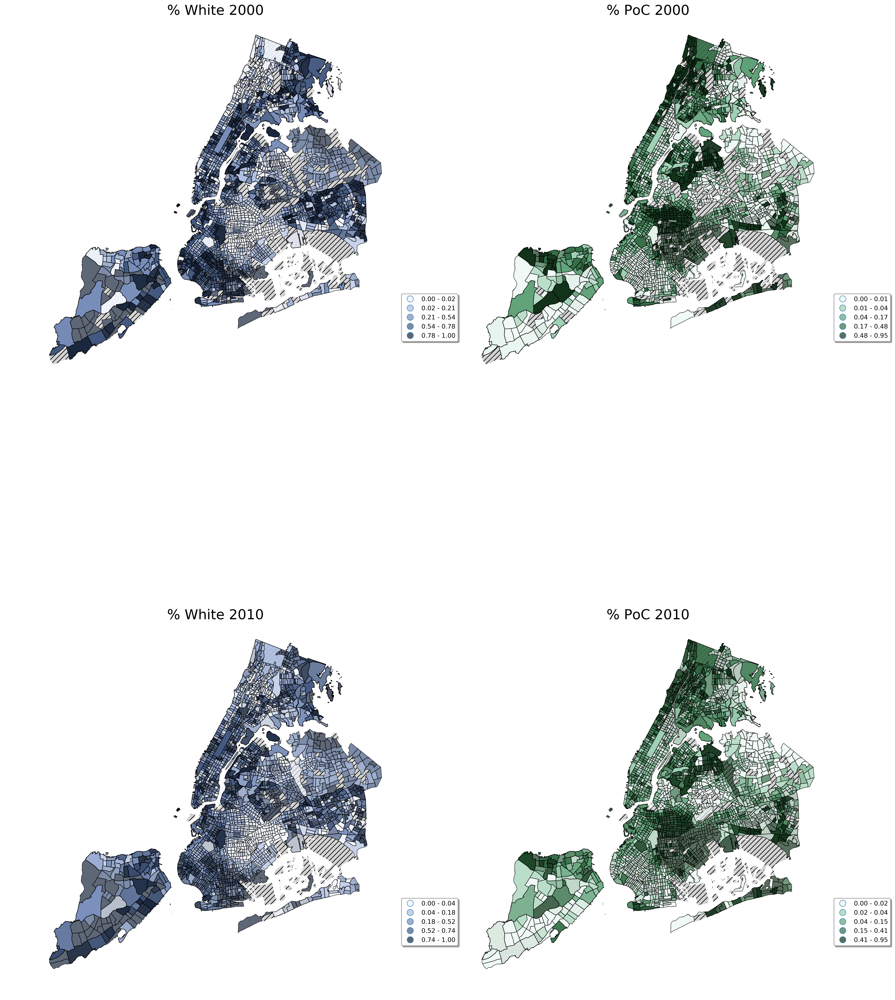

In [25]:
legend_kwds={'loc':'lower left', 
             'fontsize':10, 
             'shadow':True, 
             'fancybox':True, 
             'frameon':True,
             'framealpha':1.0,
             'edgecolor':'#999999',
             'facecolor':'#FFFFFF',
             'bbox_to_anchor':(1, 0.1)}

f, ((ax1, ax2), (ax3, ax4)) = plt.subplots(
    ncols=2, nrows=2, sharex=True, sharey=True, 
    figsize=(20, 30),
    dpi=300,
    subplot_kw=dict(aspect='equal')
    )

mask_null = nyct_shape_race['notHISP_white_c00_pct'].isnull()

nyct_shape_race[mask_null].plot(ax=ax1, color='lightgrey', hatch='///')
nyct_shape_race[~mask_null].plot(
    ax=ax1,
    column='notHISP_white_c00_pct', 
    scheme='QUANTILES', k=5, 
    cmap=sns.cubehelix_palette(start=2.8, rot=.01, dark=.15, light=.95, as_cmap=True), 
    alpha=.7, 
    edgecolor='black', 
    linewidth=0.8, 
    legend=True, 
    antialiased=True,
    legend_kwds=legend_kwds
)

mask_null = nyct_shape_race['notHISP_black_c00_pct'].isnull()

nyct_shape_race[mask_null].plot(ax=ax2, color='lightgrey', hatch='///')
nyct_shape_race[~mask_null].plot(
    ax=ax2,
    column='notHISP_black_c00_pct', 
    scheme='QUANTILES', k=5, 
    cmap=sns.cubehelix_palette(start=2, rot=.05, dark=.15, light=.95, as_cmap=True), 
    alpha=.7, 
    edgecolor='black', 
    linewidth=0.8, 
    legend=True, 
    antialiased=True,
    legend_kwds=legend_kwds
)

mask_null = nyct_shape_race['notHISP_white_c10_pct'].isnull()

nyct_shape_race[mask_null].plot(ax=ax3, color='lightgrey', hatch='///')
nyct_shape_race[~mask_null].plot(
    ax=ax3,
    column='notHISP_white_c10_pct', 
    scheme='QUANTILES', k=5, 
    cmap=sns.cubehelix_palette(start=2.8, rot=.01, dark=.15, light=.95, as_cmap=True), 
    alpha=.7, 
    edgecolor='black', 
    linewidth=0.8, 
    legend=True, 
    antialiased=True,
    legend_kwds=legend_kwds
)
 
mask_null = nyct_shape_race['notHISP_black_c10_pct'].isnull()

    
nyct_shape_race[mask_null].plot(ax=ax4, color='lightgrey', hatch='///')
nyct_shape_race[~mask_null].plot(
    ax=ax4,
    column='notHISP_black_c10_pct', 
    scheme='QUANTILES', k=5, 
    cmap=sns.cubehelix_palette(start=2, rot=.05, dark=.15, light=.95, as_cmap=True), 
    alpha=.7, 
    edgecolor='black', 
    linewidth=0.8, 
    legend=True, 
    antialiased=True,
    legend_kwds=legend_kwds
)

ax1.set_axis_off()
ax1.set_title("% White 2000", fontsize=22)
ax2.set_axis_off()
ax2.set_title("% PoC 2000", fontsize=22)
ax3.set_axis_off()
ax3.set_title("% White 2010", fontsize=22)
ax4.set_axis_off()
ax4.set_title("% PoC 2010", fontsize=22)

plt.tight_layout()
plt.show()

Comments:

- as expected, in tracts where there is a high presence of white householder, we observe a lower presence of black householder.
- It's hard to tell, but in 2010 the spatial distribution seems more homogenous

## Identify gentrified tracts
Following (Freeman 2005), gentrified tracts meet these conditions:

1 - tracts with a median income less than the median for the metropolitan area in the first period (2000)

2 - tracts that have a proportion of housing built within the past 20 years lower than the proportion found at the median for the respective metropolitan area

3 - Have a perecentage increase in educational attainment (some college or higher) greater than the median increase in educational attainment for the metropolitan area

4 - Have an increase in real housing prices or rent price during the period under consideration (2000-2013)
    
We can also classify the tracts that meet aonly the first two createria as tracts with the potential to undego gentrification.

In [26]:
all_data = df_HU.merge(df_edu, how='outer', on= ['county', 'state', 'tract'], indicator='_merge1'). \
        merge(df_HO_2000, how='outer', on= ['county', 'state', 'tract'], indicator='_merge2'). \
        merge(df_income_2000, how='outer', on= ['county', 'state', 'tract'], indicator='_merge3')

In [27]:

all_data['status'] = 'Other'
mask = ((all_data.HO_20ylow == 1) & (all_data.med_less == 1))
all_data.loc[mask,'status'] = 'Potential'
mask = (((all_data.value_increased == 1) | (all_data.rent_increased == 1)) & \
        (all_data.edu_incr_Gr == 1) & ((all_data.HO_20ylow == 1) & (all_data.med_less == 1)))
all_data.loc[mask,'status'] = 'Gentrified'
#mask = all_data['value_increased', 'rent_increased', 'edu_incr_Gr', 'HO_20ylow', 'med_less']
all_data[['value_increased', 'rent_increased', 'edu_incr_Gr', 'HO_20ylow', 'med_less']].describe()
all_data.status.value_counts()

Other         1824
Potential      237
Gentrified     156
Name: status, dtype: int64

#### Which are the neighbourhood that underwent gentrification?

We would like to visualize the spatil distribution of NYC tracts given their status (gentrified, potential, others).

In [28]:
nyct_shape_gen = nyct_shape.merge(all_data, how='left', left_on = 'CT2010', right_on = 'tract')
mask_null = nyct_shape_gen[['value_increased', 'rent_increased', 'edu_incr_Gr', 'HO_20ylow', 'med_less']].isnull().all(axis=1)


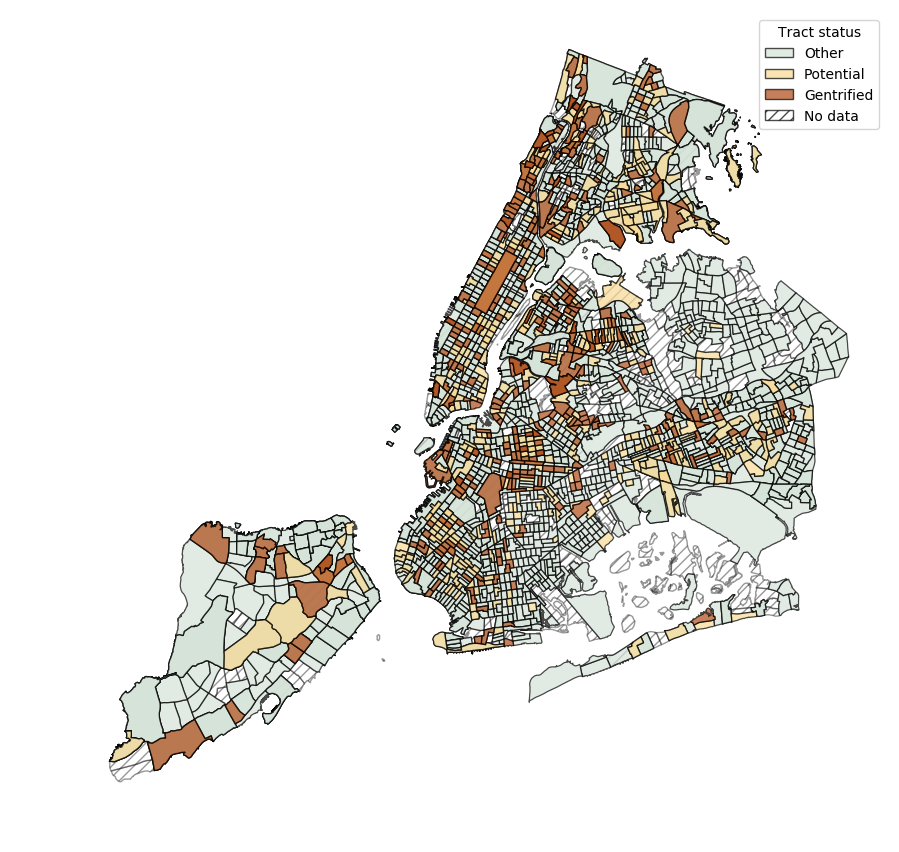

In [29]:
legend_kwds={'loc':'lower left', 
             'fontsize':20, 
             'shadow':True, 
             'fancybox':True, 
             'frameon':True,
             'framealpha':1.0,
             'edgecolor':'#999999',
             'facecolor':'#FFFFFF',
             'bbox_to_anchor':(1, 0.1)}

f, ax = plt.subplots( 
    figsize=(9, 9),
    # 
    dpi=100,
    subplot_kw=dict(aspect='equal'))

gen_pal = ['#D5E3D8', '#F9DA95', '#AE4B16']
labels = ['Other', 'Potential', 'Gentrified']


nyct_shape_gen[mask_null].plot(ax=ax, color='w', edgecolor='black', alpha=.4, hatch='///')
from matplotlib.patches import Patch
# Create custom handles as legend elements
legend_elements = []
for i in range(3):
    legend_elements.append( 
            Patch(facecolor=gen_pal[i], 
            edgecolor='black', alpha=.7,
            label=labels[i]))

legend_elements.append( Patch(facecolor='w', 
            edgecolor='black', hatch='///', alpha=.7,
            label='No data'))

nyct_shape_gen[((~mask_null) & (nyct_shape_gen.status=='Other'))].plot(
    ax=ax,
    alpha=.7, 
    facecolor=gen_pal[0], edgecolor='black',
    linewidth=0.9, 
    label=labels[0],
    legend=True, 
    antialiased=True,
    legend_kwds=legend_kwds
)

nyct_shape_gen[((~mask_null) & (nyct_shape_gen.status=='Potential'))].plot(
    ax=ax,
    alpha=.7, 
    facecolor=gen_pal[1], edgecolor='black',
    linewidth=0.9, 
    label=labels[1],
    legend=True, 
    antialiased=True,
    legend_kwds=legend_kwds
)

nyct_shape_gen[((~mask_null) & (nyct_shape_gen.status=='Gentrified'))].plot(
    ax=ax,
    alpha=.7, 
    facecolor=gen_pal[2], edgecolor='black',
    linewidth=0.9, 
    label=labels[2],
    legend=True, 
    antialiased=True,
    legend_kwds=legend_kwds
)

ax.legend(handles=legend_elements, loc='best', title='Tract status')
ax.set_axis_off()
ax.set_title("")

plt.tight_layout()
plt.show()

Comments:

- Gentrification is a scattered phenomenon (in small clusters) in NYC (less in the Queens borough of 

### Does Gentrification tend to increase diversity in neighborhoods?

We will investigate the relationship between gentrification and neghibourhood diversity.

#### Gentrification and Racial Diversity

Freeman (2009) used an entropy measure defined as follows:

$H_N = \sum_{r=1} p_{rt} log(\frac{1}{p_{rt}})$ where $p_{rt}$ is the proportion of families in tract $t$ and race/ethnic group $r$.

We used a similar measure, slightly modified:
`S = -sum(pk * log(pk), axis=0)`

In [30]:
nyct_shape_race = nyct_shape.merge(df_hhr_race_2010, how='left', left_on = 'CT2010', right_on = 'tract')
nyct_shape_race = nyct_shape_race.merge(df_hhr_race_2000, how='left', left_on = 'CT2010', right_on = 'tract', suffixes = ('_10', '_00'))

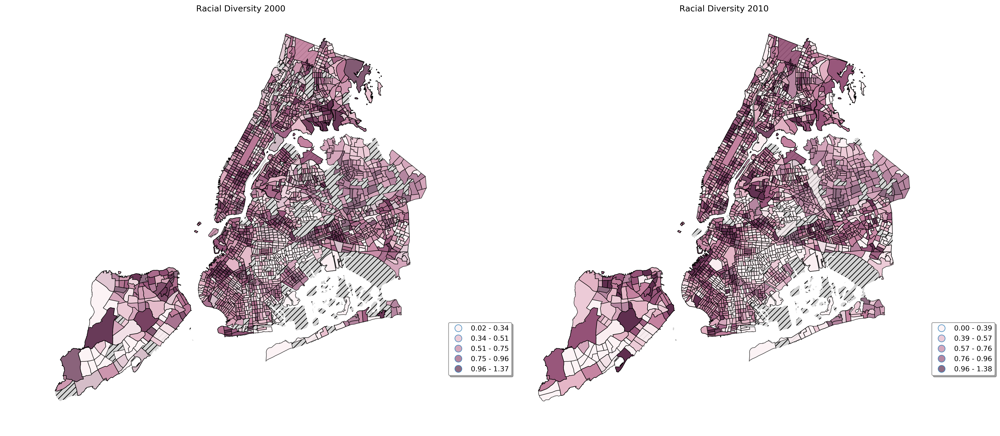

In [31]:
legend_kwds={'loc':'lower left', 
             'fontsize':10, 
             'shadow':True, 
             'fancybox':True, 
             'frameon':True,
             'framealpha':1.0,
             'edgecolor':'#999999',
             'facecolor':'#FFFFFF',
             'bbox_to_anchor':(1, 0.1)}

f, (ax1, ax2) = plt.subplots(
    ncols=2,  sharex=True, sharey=True, 
    figsize=(20, 20),
    dpi=300,
    subplot_kw=dict(aspect='equal')
    )

mask_null = nyct_shape_race['racial_entropy_00'].isnull()

nyct_shape_race[mask_null].plot(ax=ax1, color='lightgrey', hatch='///')
nyct_shape_race[~mask_null].plot(
    ax=ax1,
    column='racial_entropy_00', 
    scheme='QUANTILES', k=5, 
    cmap=sns.cubehelix_palette(start=0.5, rot=.1, dark=.25, light=.95, as_cmap=True), 
    alpha=.7, 
    edgecolor='black', 
    linewidth=0.8, 
    legend=True, 
    antialiased=True,
    legend_kwds=legend_kwds
)

mask_null = nyct_shape_race['racial_entropy_10'].isnull()

nyct_shape_race[mask_null].plot(ax=ax2, color='lightgrey', hatch='///')
nyct_shape_race[~mask_null].plot(
    ax=ax2,
    column='racial_entropy_10', 
    scheme='QUANTILES', k=5, 
    cmap=sns.cubehelix_palette(start=0.5, rot=.1, dark=.25, light=.95, as_cmap=True), 
    alpha=.7, 
    edgecolor='black', 
    linewidth=0.8, 
    legend=True, 
    antialiased=True,
    legend_kwds=legend_kwds
)



ax1.set_axis_off()
ax1.set_title("Racial Diversity 2000")
ax2.set_axis_off()
ax2.set_title("Racial Diversity 2010")


plt.tight_layout()
plt.show()

In [32]:
all_data = all_data.merge(df_hhr_race_2010, how='left', on = 'tract'). \
    merge(df_hhr_race_2000, how='left', on = 'tract', suffixes = ('_10', '_00'))

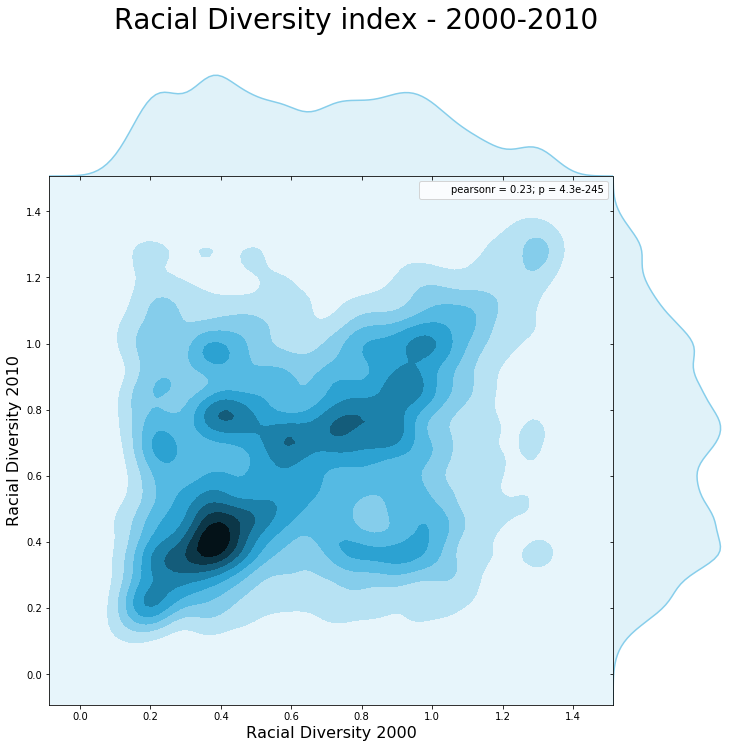

In [41]:
data = all_data[['racial_entropy_00', 'racial_entropy_10', 'H_edu_pct_00', 'H_edu_pct_10', 'status', 'value_change_pct',
       'rent_change_pct']].dropna(axis=0)
data.dtypes

g = sns.jointplot(x=data["racial_entropy_00"], y=data["racial_entropy_10"],   kind="kde", space=0, color="skyblue")

g.fig.set_size_inches(11,11)
plt.subplots_adjust(top=0.9)
g.fig.suptitle('Racial Diversity index - 2000-2010', fontsize=28)
g.set_axis_labels('Racial Diversity 2000', 'Racial Diversity 2010', fontsize=16)
#plt.tight_layout()
plt.show()

#### Distribution of the diversity index

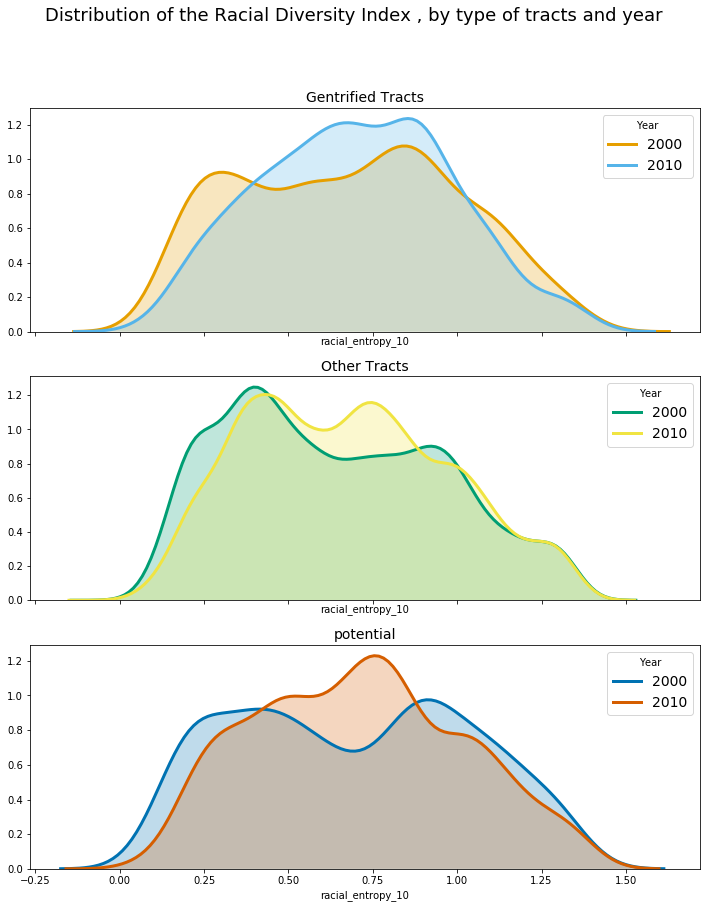

In [34]:
fig, (ax1, ax2, ax3) = plt.subplots(nrows=3, figsize=(12, 14), sharex=True)
mask = (~(all_data.racial_entropy_00.isnull()) & (all_data.status == 'Gentrified'))
sns.distplot(all_data.loc[mask, "racial_entropy_00"], hist = False, kde = True,
                 kde_kws = {'shade': True, 'linewidth': 3}, 
                  label = '2000', ax=ax1, color=pal[0])
mask = (~(all_data.racial_entropy_10.isnull()) & (all_data.status == 'Gentrified'))
sns.distplot(all_data.loc[mask, "racial_entropy_10"], hist = False, kde = True,
                 kde_kws = {'shade': True, 'linewidth': 3}, 
                  label = '2010 ',  ax=ax1, color=pal[1])

ax1.legend(loc='best', title='Year', prop={'size': 14})
ax1.set_title("Gentrified Tracts", fontsize=14)

mask = (~(all_data.racial_entropy_00.isnull()) & (all_data.status == 'Other'))
sns.distplot(all_data.loc[mask, "racial_entropy_00"], hist = False, kde = True,
                 kde_kws = {'shade': True, 'linewidth': 3}, 
                  label = '2000', ax=ax2, color=pal[2])
mask = (~(all_data.racial_entropy_10.isnull()) & (all_data.status == 'Other'))
sns.distplot(all_data.loc[mask, "racial_entropy_10"], hist = False, kde = True,
                 kde_kws = {'shade': True, 'linewidth': 3}, 
                  label = '2010',  ax=ax2, color=pal[3])

ax2.legend(loc='best', title='Year', prop={'size': 14})
ax2.set_title("Other Tracts", fontsize=14)


mask = (~(all_data.racial_entropy_00.isnull()) & (all_data.status == 'Potential'))
sns.distplot(all_data.loc[mask, "racial_entropy_00"], hist = False, kde = True,
                 kde_kws = {'shade': True, 'linewidth': 3}, 
                  label = '2000', ax=ax3, color=pal[4])
mask = (~(all_data.racial_entropy_10.isnull()) & (all_data.status == 'Potential'))
sns.distplot(all_data.loc[mask, "racial_entropy_10"], hist = False, kde = True,
                 kde_kws = {'shade': True, 'linewidth': 3}, 
                  label = '2010',  ax=ax3, color=pal[5])

ax3.legend(loc='best', title='Year', prop={'size': 14})
ax3.set_title("potential", fontsize=14)


plt.suptitle("Distribution of the Racial Diversity Index , by type of tracts and year", fontsize=18)

#plt.tight_layout()
plt.show()

#### Household income distribution 

Regarding income, we take into account inflation and adjust the value for 2000.

In [35]:
all_data = all_data.merge(df_income_2010, how='left', on = 'tract', suffixes = ('_00', '_10'))


In [36]:
all_data['med_inc_00'] = all_data['med_inc_00'] *  352.6 / 244.6
all_data.columns

Index(['HU_tot_e', 'HU_med_rent_10', 'HU_med_value_10', 'HU_agg_value_10',
       'county_x', 'state_x', 'tract', 'HU_occ_pct_10', 'HU_owner_pct_10',
       'HU_tot', 'HU_med_rent_00', 'HU_med_value_00', 'HU_agg_value_00',
       'HU_occ_pct_00', 'HU_owner_pct_00', 'value_change_pct',
       'rent_change_pct', 'value_increased', 'rent_increased',
       'edu_tot25over_10', 'edu_SC3', 'edu_totHS_pct_10', 'edu_SC_pct_10',
       'edu_grad_pct_10', 'edu_HSdrop_pct_10', 'H_edu_pct_10',
       'edu_tot25over_00', 'edu_totHS_pct_00', 'edu_SC_pct_00',
       'edu_grad_pct_00', 'edu_HSdrop_pct_00', 'H_edu_pct_00', 'H_edu_Incr',
       'edu_incr_Gr', '_merge1', 'HO_tot', 'HO_20y_pct', 'HO_20ylow',
       '_merge2', 'med_inc_00', 'city_med_00', 'med_less', '_merge3', 'status',
       'county_y', 'state_y', 'tot_c10_pct', 'notHISP_white_c10_pct',
       'notHISP_black_c10_pct', 'notHISP_asian_c10_pct', 'other_c10_pct',
       'racial_entropy_10', 'county_00', 'state_00', 'tot_c00_pct',
       'no

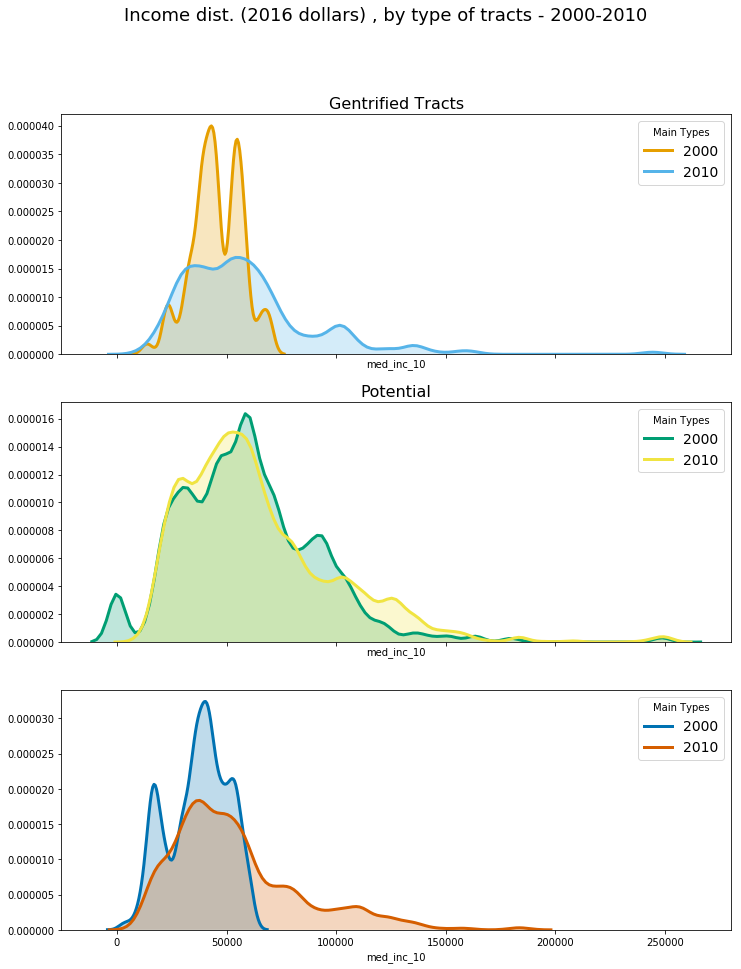

In [37]:
fig, (ax1, ax2, ax3) = plt.subplots(nrows=3, figsize=(12, 15), sharex=True)
mask = (~(all_data.med_inc_00.isnull()) & (all_data.status == 'Gentrified'))
sns.distplot(all_data.loc[mask, "med_inc_00"], hist = False, kde = True,
                 kde_kws = {'shade': True, 'linewidth': 3}, 
                  label = '2000', ax=ax1, color=pal[0])
mask = (~(all_data.med_inc_10.isnull()) & (all_data.status == 'Gentrified'))
sns.distplot(all_data.loc[mask, "med_inc_10"], hist = False, kde = True,
                 kde_kws = {'shade': True, 'linewidth': 3}, 
                  label = '2010',  ax=ax1, color=pal[1])

ax1.legend(loc='best', title='Main Types', prop={'size': 14})
ax1.set_title("Gentrified Tracts", fontsize=16)

mask = (~(all_data.med_inc_00.isnull()) & (all_data.status == 'Other'))
sns.distplot(all_data.loc[mask, "med_inc_00"], hist = False, kde = True,
                 kde_kws = {'shade': True, 'linewidth': 3}, 
                  label = '2000', ax=ax2, color=pal[2])
mask = (~(all_data.med_inc_10.isnull()) & (all_data.status == 'Other'))
sns.distplot(all_data.loc[mask, "med_inc_10"], hist = False, kde = True,
                 kde_kws = {'shade': True, 'linewidth': 3}, 
                  label = '2010',  ax=ax2, color=pal[3])

ax2.legend(loc='best', title='Main Types', prop={'size': 14})
ax2.set_title("Other tracts", fontsize=16)

mask = (~(all_data.med_inc_00.isnull()) & (all_data.status == 'Potential'))
sns.distplot(all_data.loc[mask, "med_inc_00"], hist = False, kde = True,
                 kde_kws = {'shade': True, 'linewidth': 3}, 
                  label = '2000', ax=ax3, color=pal[4])
mask = (~(all_data.med_inc_10.isnull()) & (all_data.status == 'Potential'))
sns.distplot(all_data.loc[mask, "med_inc_10"], hist = False, kde = True,
                 kde_kws = {'shade': True, 'linewidth': 3}, 
                  label = '2010',  ax=ax3, color=pal[5])

ax3.legend(loc='best', title='Main Types', prop={'size': 14})
ax2.set_title("Potential", fontsize=16)

plt.suptitle("Income dist. (2016 dollars) , by type of tracts - 2000-2010", fontsize=18)
#plt.tight_layout()
plt.show()

Comments:
- we can observe an increase of racial diversity in the last decade
- the increase in racial diversity is common among all tracts
- gentrification per se does not appear foster diversity in NYC
- the income distribution (in 2016 dollars) shift on the right for both the gentrified tracts and the potential tracts.

# Bibliography

Freeman, Lance. 2009. “Neighbourhood Diversity, Metropolitan Segregation and Gentrification: What Are the Links in the US?” Urban Studies 46 (10): 2079–2101. https://doi.org/10.1177/0042098009339426.

Freeman, Lance. "Displacement or succession? Residential mobility in gentrifying neighborhoods." Urban Affairs Review 40.4 (2005): 463-491.